Implement a Gaze-LLE to keep track of who is looking at who

In [7]:
%pip install timm
%pip install RetinaFace
%pip install opencv-python
%pip install retina-face
%pip install tf-keras
%pip install yt-dlp

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
  Using cached retinaface-1.1.1-py3-none-any.whl.metadata (2.1 kB)
INFO: pip is looking at multiple versions of retinaface to determine which version is compatible with other requirements. This could take a while.
  Using cached retinaface-1.1.0-py3-none-any.whl.metadata (2.0 kB)
  Using cached retinaface-0.0.6-py3-none-any.whl.metadata (1.6 kB)
  Using cached retinaface-0.0.5-py3-none-any.whl.metadata (1.4 kB)
  Using cached retinaface-0.0.4-py3-none-any.whl.metadata (725 bytes)
  Using cached retinaface-0.0.3-py3-none-any.whl.metadata (725 bytes)
  Using cached retinaface-0.0.2-py3-none-any.whl.metadata

In [8]:
%pip install torch

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [9]:
import torch

# load Gaze-LLE model
model, transform = torch.hub.load('fkryan/gazelle', 'gazelle_dinov2_vitl14_inout')

model.eval()
model.to('cpu')

Using cache found in /Users/xuanzhang/.cache/torch/hub/fkryan_gazelle_main
Using cache found in /Users/xuanzhang/.cache/torch/hub/facebookresearch_dinov2_main


GazeLLE(
  (backbone): DinoV2Backbone(
    (model): DinoVisionTransformer(
      (patch_embed): PatchEmbed(
        (proj): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14))
        (norm): Identity()
      )
      (blocks): ModuleList(
        (0-23): 24 x NestedTensorBlock(
          (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (attn): MemEffAttention(
            (qkv): Linear(in_features=1024, out_features=3072, bias=True)
            (attn_drop): Dropout(p=0.0, inplace=False)
            (proj): Linear(in_features=1024, out_features=1024, bias=True)
            (proj_drop): Dropout(p=0.0, inplace=False)
          )
          (ls1): LayerScale()
          (drop_path1): Identity()
          (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (mlp): Mlp(
            (fc1): Linear(in_features=1024, out_features=4096, bias=True)
            (act): GELU(approximate='none')
            (fc2): Linear(in_features=4096, out_features=10

In [21]:
print('hi')

hi


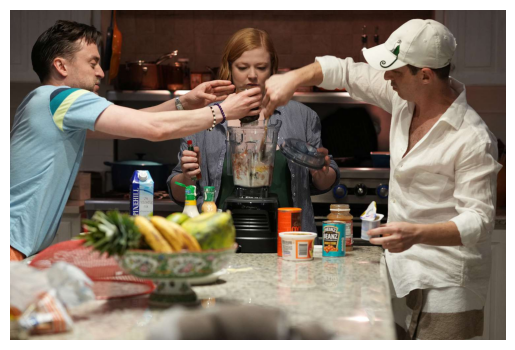

In [22]:
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import requests
from io import BytesIO
import numpy as np

# load an input image

#image_url = "https://www.looper.com/img/gallery/the-office-funniest-moments-ranked/jim-and-dwights-customer-service-training-1627594561.jpg"
image_url = "https://ew.com/thmb/n5b8Asz4Y5Lp0sSEF7WgS-ESyFc=/1500x0/filters:no_upscale():max_bytes(150000):strip_icc()/succession-finale-052923-ec304aabcbf24a7b9fad891a87f49b74.jpg"
# image_url = "https://i.kym-cdn.com/entries/icons/original/000/045/575/blackcatzoningout_meme.jpg"

try:
    response = requests.get(image_url, stream=True)
    response.raise_for_status()

    image = Image.open(BytesIO(response.content))
    width, height = image.size

    plt.imshow(image)
    plt.axis('off')
    plt.show()

except requests.exceptions.RequestException as e:
    print(f"Error downloading image: {e}")

In [23]:
# detect faces
from retinaface import RetinaFace
resp = RetinaFace.detect_faces(np.array(image))
print(resp)
bboxes = [resp[key]['facial_area'] for key in resp.keys()]
print(bboxes)

{'face_1': {'score': 0.9996662735939026, 'facial_area': [668, 114, 786, 266], 'landmarks': {'right_eye': [704.5964, 177.45291], 'left_eye': [758.9017, 177.8262], 'nose': [733.08453, 209.56973], 'mouth_right': [710.18304, 233.62779], 'mouth_left': [751.0907, 233.69525]}}, 'face_2': {'score': 0.9993746280670166, 'facial_area': [1140, 131, 1239, 272], 'landmarks': {'right_eye': [1156.5194, 178.33797], 'left_eye': [1160.1232, 186.5789], 'nose': [1137.0168, 211.62556], 'mouth_right': [1164.8771, 234.76575], 'mouth_left': [1166.3639, 239.30296]}}, 'face_3': {'score': 0.9987086057662964, 'facial_area': [172, 91, 282, 262], 'landmarks': {'right_eye': [253.8445, 169.07759], 'left_eye': [268.5239, 168.38167], 'nose': [282.3621, 200.293], 'mouth_right': [251.48785, 228.21509], 'mouth_left': [259.5506, 228.69417]}}}
[[668, 114, 786, 266], [1140, 131, 1239, 272], [172, 91, 282, 262]]


In [24]:
# prepare gazelle input
device = 'cuda' if torch.cuda.is_available() else 'cpu'
img_tensor = transform(image).unsqueeze(0).to(device)
norm_bboxes = [[np.array(bbox) / np.array([width, height, width, height]) for bbox in bboxes]]

input = {
    "images": img_tensor, # [num_images, 3, 448, 448]
    "bboxes": norm_bboxes # [[img1_bbox1, img1_bbox2...], [img2_bbox1, img2_bbox2]...]
}

with torch.no_grad():
    output = model(input)

img1_person1_heatmap = output['heatmap'][0][0] # [64, 64] heatmap
print(img1_person1_heatmap.shape)
if model.inout:
  img1_person1_inout = output['inout'][0][0] # gaze in frame score (if model supports inout prediction)
  print(img1_person1_inout.item())


torch.Size([64, 64])
0.9973506927490234


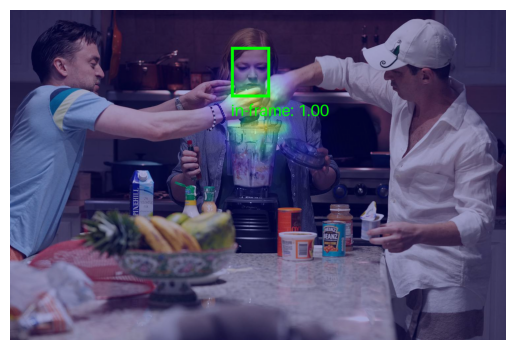

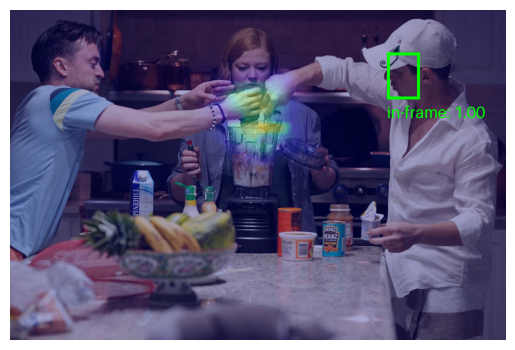

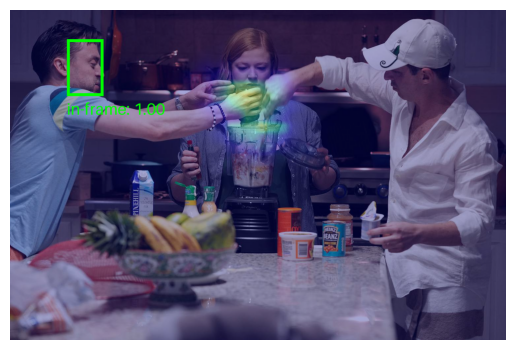

In [25]:
# visualize predicted gaze heatmap for each person and gaze in/out of frame score

def visualize_heatmap(pil_image, heatmap, bbox=None, inout_score=None):
    if isinstance(heatmap, torch.Tensor):
        heatmap = heatmap.detach().cpu().numpy()
    heatmap = Image.fromarray((heatmap * 255).astype(np.uint8)).resize(pil_image.size, Image.Resampling.BILINEAR)
    heatmap = plt.cm.jet(np.array(heatmap) / 255.)
    heatmap = (heatmap[:, :, :3] * 255).astype(np.uint8)
    heatmap = Image.fromarray(heatmap).convert("RGBA")
    heatmap.putalpha(90)
    overlay_image = Image.alpha_composite(pil_image.convert("RGBA"), heatmap)

    if bbox is not None:
        width, height = pil_image.size
        xmin, ymin, xmax, ymax = bbox
        draw = ImageDraw.Draw(overlay_image)
        draw.rectangle([xmin * width, ymin * height, xmax * width, ymax * height], outline="lime", width=int(min(width, height) * 0.01))

        if inout_score is not None:
          text = f"in-frame: {inout_score:.2f}"
          text_width = draw.textlength(text)
          text_height = int(height * 0.01)
          text_x = xmin * width
          text_y = ymax * height + text_height
          draw.text((text_x, text_y), text, fill="lime", font=ImageFont.load_default(size=int(min(width, height) * 0.05)))
    return overlay_image

for i in range(len(bboxes)):
  plt.figure()
  plt.imshow(visualize_heatmap(image, output['heatmap'][0][i], norm_bboxes[0][i], inout_score=output['inout'][0][i] if output['inout'] is not None else None))
  plt.axis('off')
  plt.show()



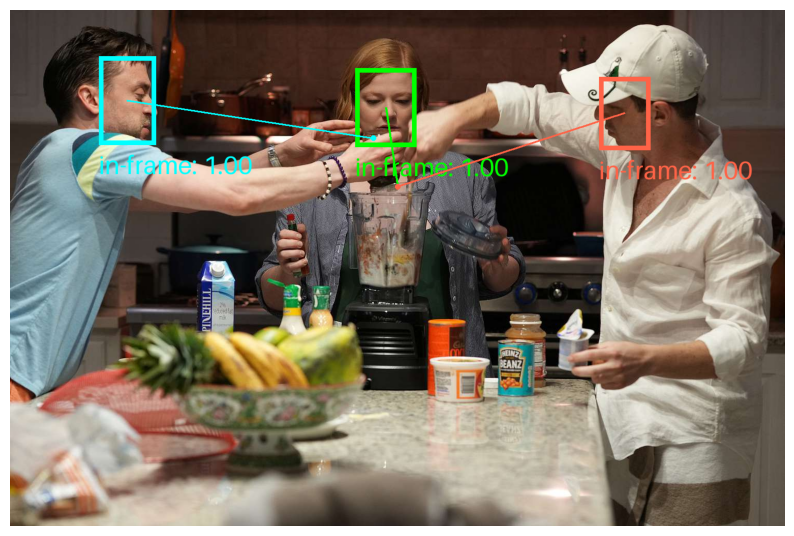

In [26]:
# combined visualization with maximal gaze points for each person

def visualize_all(pil_image, heatmaps, bboxes, inout_scores, inout_thresh=0.5):
    colors = ['lime', 'tomato', 'cyan', 'fuchsia', 'yellow']
    overlay_image = pil_image.convert("RGBA")
    draw = ImageDraw.Draw(overlay_image)
    width, height = pil_image.size

    for i in range(len(bboxes)):
        bbox = bboxes[i]
        xmin, ymin, xmax, ymax = bbox
        color = colors[i % len(colors)]
        draw.rectangle([xmin * width, ymin * height, xmax * width, ymax * height], outline=color, width=int(min(width, height) * 0.01))

        if inout_scores is not None:
            inout_score = inout_scores[i]
            text = f"in-frame: {inout_score:.2f}"
            text_width = draw.textlength(text)
            text_height = int(height * 0.01)
            text_x = xmin * width
            text_y = ymax * height + text_height
            draw.text((text_x, text_y), text, fill=color, font=ImageFont.load_default(size=int(min(width, height) * 0.05)))

        if inout_scores is not None and inout_score > inout_thresh:
            heatmap = heatmaps[i]
            heatmap_np = heatmap.detach().cpu().numpy()
            max_index = np.unravel_index(np.argmax(heatmap_np), heatmap_np.shape)
            gaze_target_x = max_index[1] / heatmap_np.shape[1] * width
            gaze_target_y = max_index[0] / heatmap_np.shape[0] * height
            bbox_center_x = ((xmin + xmax) / 2) * width
            bbox_center_y = ((ymin + ymax) / 2) * height

            draw.ellipse([(gaze_target_x-5, gaze_target_y-5), (gaze_target_x+5, gaze_target_y+5)], fill=color, width=int(0.005*min(width, height)))
            draw.line([(bbox_center_x, bbox_center_y), (gaze_target_x, gaze_target_y)], fill=color, width=int(0.005*min(width, height)))

    return overlay_image

plt.figure(figsize=(10,10))
plt.imshow(visualize_all(image, output['heatmap'][0], norm_bboxes[0], output['inout'][0] if output['inout'] is not None else None, inout_thresh=0.5))
plt.axis('off')
plt.show()

In [27]:
import cv2
import os

def split_video_into_frames(video_path, output_folder):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Open the video file
    cap = cv2.VideoCapture(video_path)

    # Check if the video file was opened correctly
    if not cap.isOpened():
        print("Error: Could not open video.")
        return

    # Get the frame rate (fps) of the video
    fps = cap.get(cv2.CAP_PROP_FPS)

    frame_count = 0
    frame_interval = int(fps)  # Capture 1 frame per second

    while True:
        # Set the position to the next frame at the interval
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_count * frame_interval)

        # Read a frame from the video
        ret, frame = cap.read()

        # If the frame was successfully read
        if ret:
            # Generate filename for the frame
            frame_filename = os.path.join(output_folder, f"frame_{frame_count:04d}.jpg")

            # Save the frame as an image
            cv2.imwrite(frame_filename, frame)

            # Print frame number
            print(f"Frame {frame_count} saved as {frame_filename}")

            # Increment frame count
            frame_count += 1
        else:
            # End of the video, break the loop
            break

    # Release the video capture object
    cap.release()
    print(f"Video split into {frame_count} frames.")

# Example usage
video_path = "/Users/xuanzhang/Desktop/office/theoffice/20250312_FineDrabTardigradeAMPTropPunch-v5zAsfIVNJNlkktn_source.mp4"  # Replace with your video file path
output_folder = "/Users/xuanzhang/Desktop/office/theoffice"  # Folder to save the frames

split_video_into_frames(video_path, output_folder)

Frame 0 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0000.jpg
Frame 1 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0001.jpg
Frame 2 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0002.jpg
Frame 3 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0003.jpg
Frame 4 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0004.jpg
Frame 5 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0005.jpg
Frame 6 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0006.jpg
Frame 7 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0007.jpg
Frame 8 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0008.jpg
Frame 9 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0009.jpg
Frame 10 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0010.jpg
Frame 11 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0011.jpg
Frame 12 saved as /Users/xuanzhang/Desktop/office/theoffice/frame_0012.jpg
Frame 13 saved as /Users/xuanzhang/

In [31]:
import torch
from PIL import Image
from torchvision import transforms
import numpy as np
from retinaface import RetinaFace

# Define transform (make sure it's the same as your original transform)
transform = transforms.Compose([
    transforms.Resize((448, 448)),
    transforms.ToTensor(),
])

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Assuming you have a list of 19 image paths
image_paths = ["frame_0000.jpg", "frame_0001.jpg", "frame_0002.jpg", "frame_0003.jpg", "frame_0004.jpg", 
               "frame_0005.jpg", "frame_0006.jpg", "frame_0007.jpg", "frame_0008.jpg", "frame_0009.jpg", 
               "frame_0010.jpg", "frame_0011.jpg", "frame_0012.jpg", "frame_0013.jpg", "frame_0014.jpg", 
               "frame_0015.jpg", "frame_0016.jpg", "frame_0017.jpg", "frame_0018.jpg", "frame_0019.jpg"]  # Replace with actual paths

# Initialize lists to hold image tensors and bounding boxes
img_tensors = []
norm_bboxes = []

# Loop through all images
for image_path in image_paths:
    # Open image
    image = Image.open(image_path)

    # Get image dimensions (width and height)
    width, height = image.size

    # Convert image to numpy array for RetinaFace
    np_image = np.array(image)

    # Detect faces using RetinaFace
    resp = RetinaFace.detect_faces(np_image)

    # Extract bounding boxes (if faces are detected)
    if resp:
        bboxes = [resp[key]['facial_area'] for key in resp.keys()]
    else:
        # If no faces detected, provide a placeholder (you can adjust this as needed)
        bboxes = []

    # Normalize the bounding boxes (if any exist)
    norm_bboxes.append([np.array(bbox) / np.array([width, height, width, height]) for bbox in bboxes])

    # Transform image and add batch dimension
    img_tensor = transform(image).unsqueeze(0).to(device)
    img_tensors.append(img_tensor)

# Stack all image tensors into a single batch
img_batch = torch.cat(img_tensors, dim=0)

# Now norm_bboxes is already in the required format for multiple images
input = {
    "images": img_batch,  # [19, 3, 448, 448]
    "bboxes": norm_bboxes  # List of normalized bounding boxes for each image
}

# Run the model in inference mode (with no gradients)
with torch.no_grad():
    output = model(input)

# Accessing results for the first image as an example
img1_person1_heatmap = output['heatmap'][0][0]  # [64, 64] heatmap for image 1
print(img1_person1_heatmap.shape)

# If model supports 'inout', get gaze in frame score for the first image
if model.inout:
    img1_person1_inout = output['inout'][0][0]  # Gaze in frame score for image 1
    print(img1_person1_inout.item())


torch.Size([64, 64])
0.9803780913352966


In [40]:
print(bboxes[i])

[1163, 365, 1254, 479]


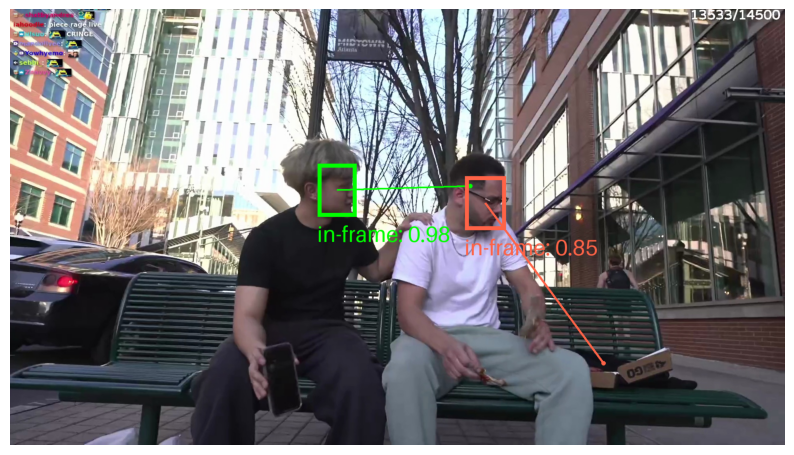

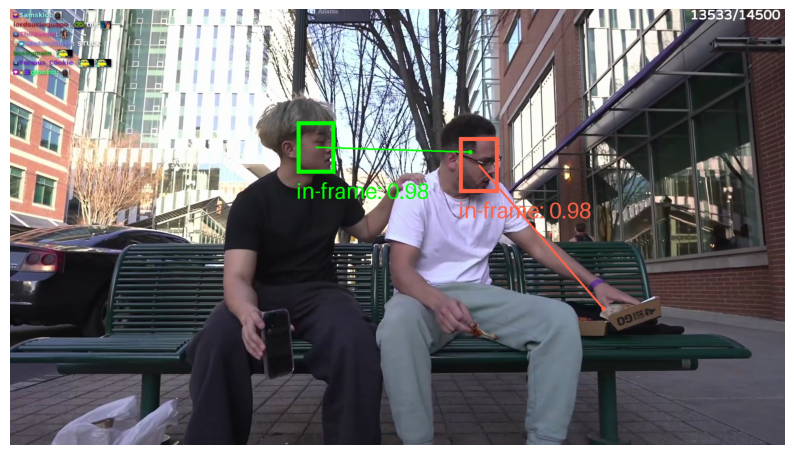

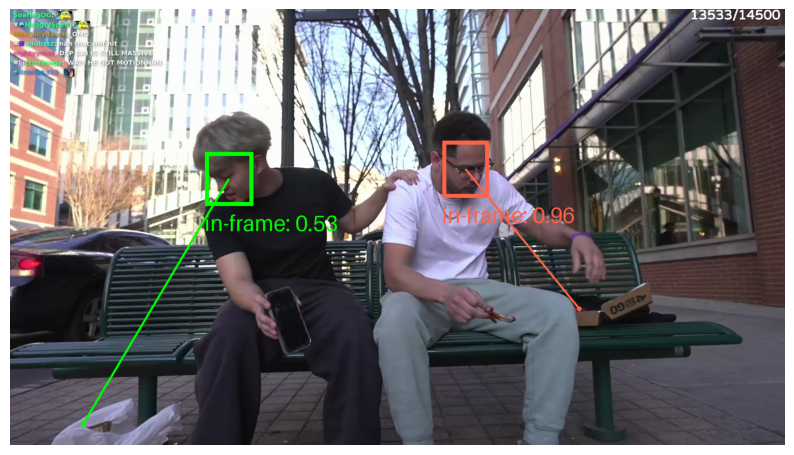

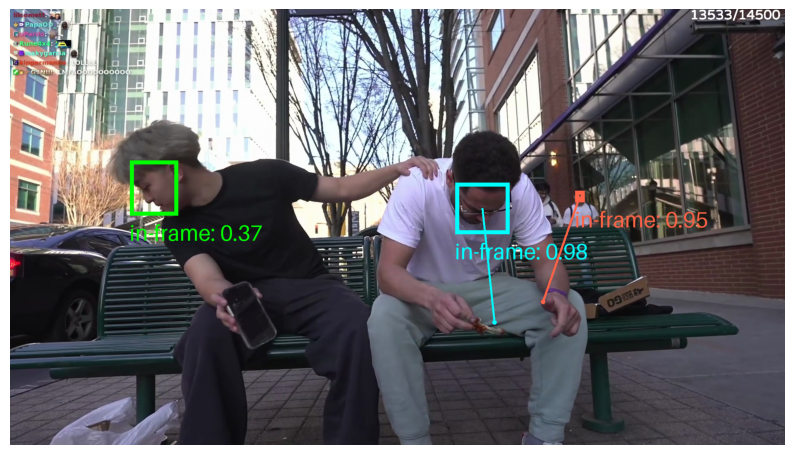

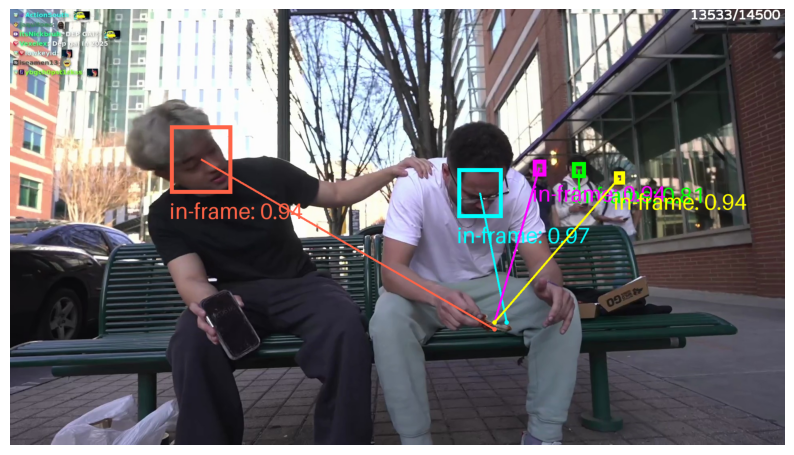

...

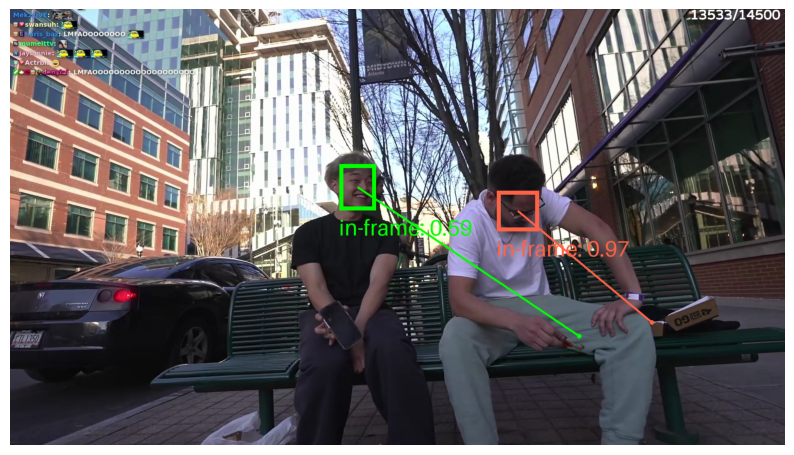

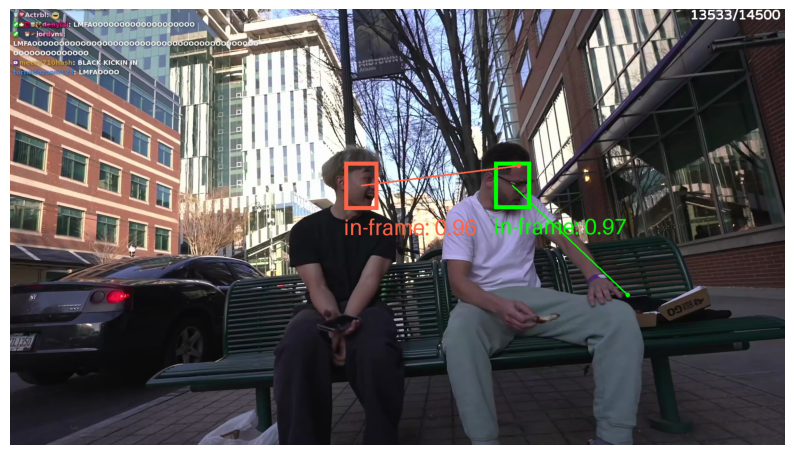

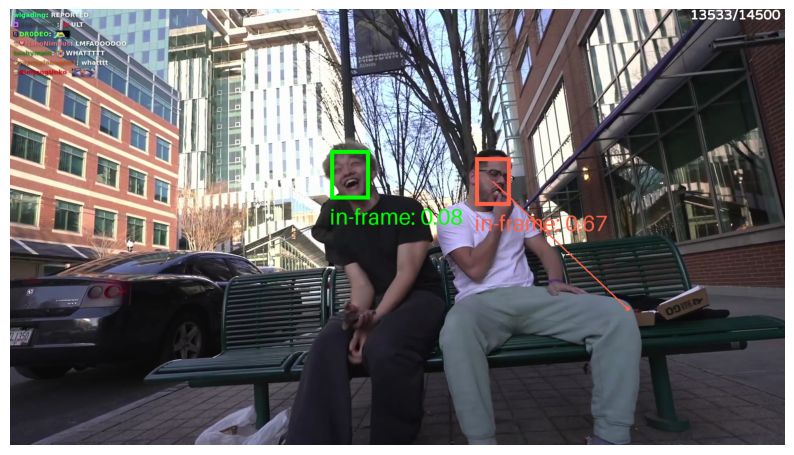

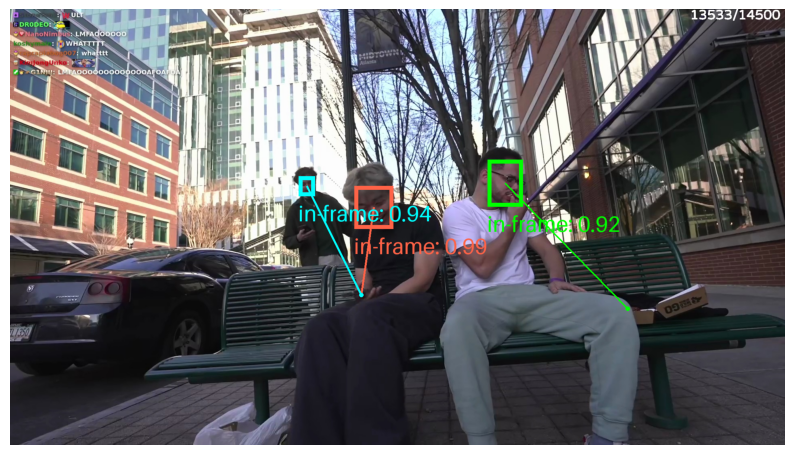

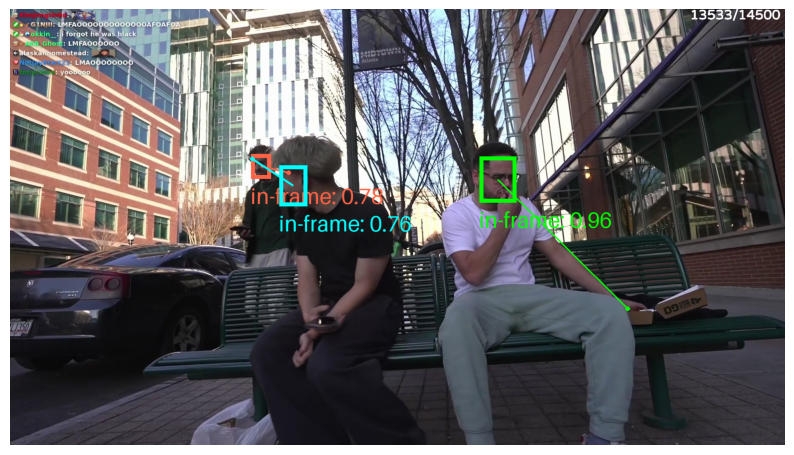

In [47]:
# combined visualization with maximal gaze points for each person
def visualize_all(pil_image, heatmaps, bboxes, inout_scores, inout_thresh=0.5):
    colors = ['lime', 'tomato', 'cyan', 'fuchsia', 'yellow']
    overlay_image = pil_image.convert("RGBA")
    draw = ImageDraw.Draw(overlay_image)
    width, height = pil_image.size

    for i in range(len(bboxes)):
        bbox = bboxes[i]
        xmin, ymin, xmax, ymax = bbox
        color = colors[i % len(colors)]
        draw.rectangle([xmin * width, ymin * height, xmax * width, ymax * height], outline=color, width=int(min(width, height) * 0.01))

        if inout_scores is not None:
            inout_score = inout_scores[i]
            text = f"in-frame: {inout_score:.2f}"
            text_width = draw.textlength(text)
            text_height = int(height * 0.01)
            text_x = xmin * width
            text_y = ymax * height + text_height
            draw.text((text_x, text_y), text, fill=color, font=ImageFont.load_default(size=int(min(width, height) * 0.05)))

        if inout_scores is not None and inout_score > inout_thresh:
            heatmap = heatmaps[i]
            heatmap_np = heatmap.detach().cpu().numpy()
            max_index = np.unravel_index(np.argmax(heatmap_np), heatmap_np.shape)
            gaze_target_x = max_index[1] / heatmap_np.shape[1] * width
            gaze_target_y = max_index[0] / heatmap_np.shape[0] * height
            bbox_center_x = ((xmin + xmax) / 2) * width
            bbox_center_y = ((ymin + ymax) / 2) * height

            draw.ellipse([(gaze_target_x-5, gaze_target_y-5), (gaze_target_x+5, gaze_target_y+5)], fill=color, width=int(0.005*min(width, height)))
            draw.line([(bbox_center_x, bbox_center_y), (gaze_target_x, gaze_target_y)], fill=color, width=int(0.005*min(width, height)))

    return overlay_image

for idx,image_path in enumerate(image_paths):
    # Open image
    image = Image.open(image_path)
    plt.figure(figsize=(10,10))
    plt.imshow(visualize_all(image, output['heatmap'][idx], norm_bboxes[idx], output['inout'][idx] if output['inout'] is not None else None, inout_thresh=0.5))
    plt.axis('off')
    plt.show()